Satvika Eda, Divya Sri Bandaru & Dhriti Anjaria
5th April 2025

# Stroke-Based Colorization with Pretrained Stable Diffusion + ControlNet

This notebook contains the inference for the **stroke-based image colorization using pretrained models only** without fine tuning and the experimentation of the stroke based dataset and its visualization.


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


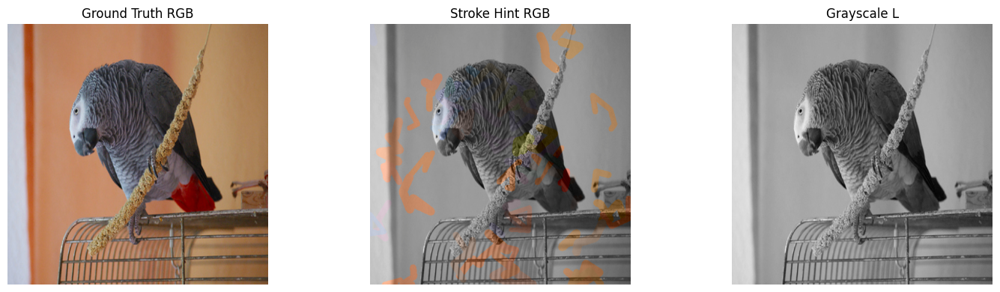

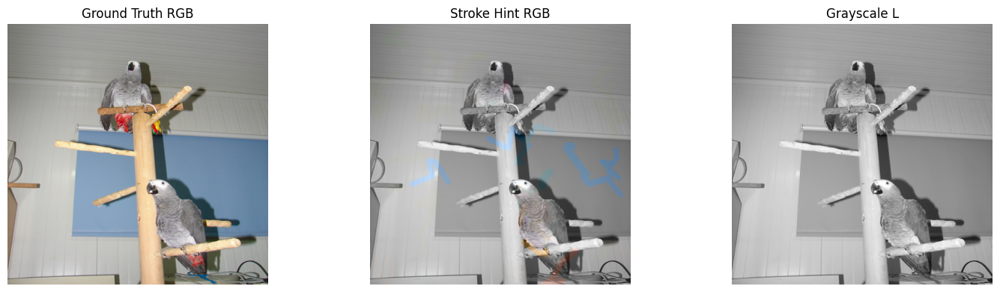

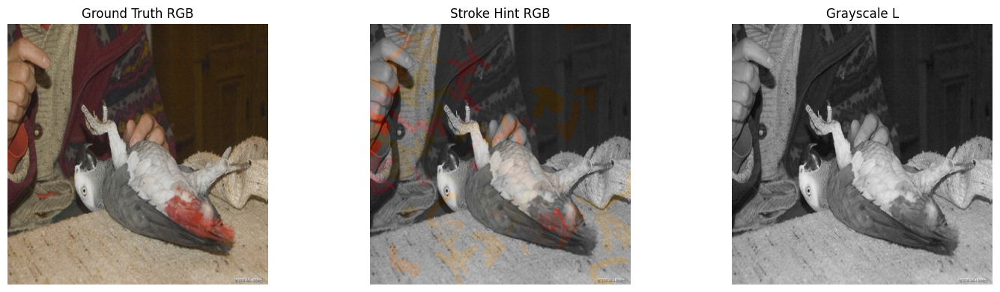

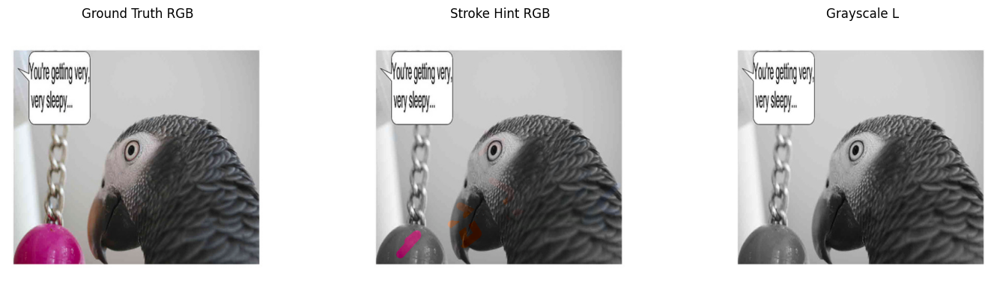

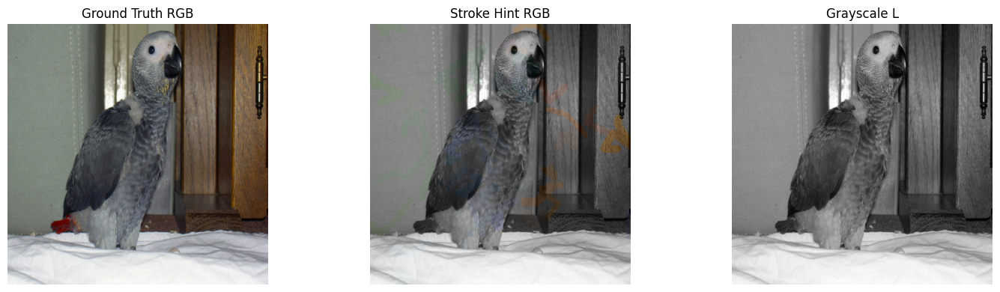

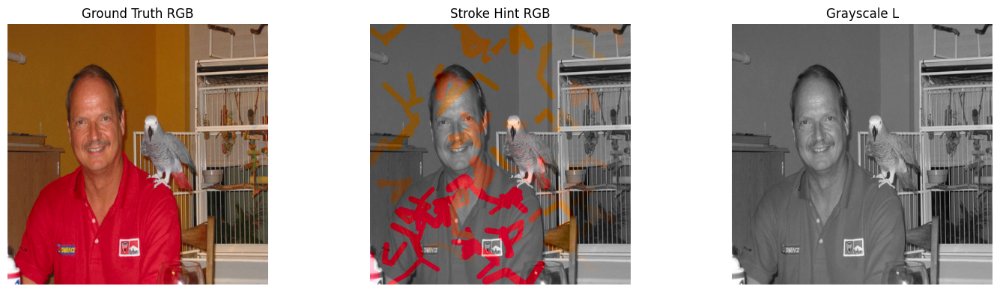

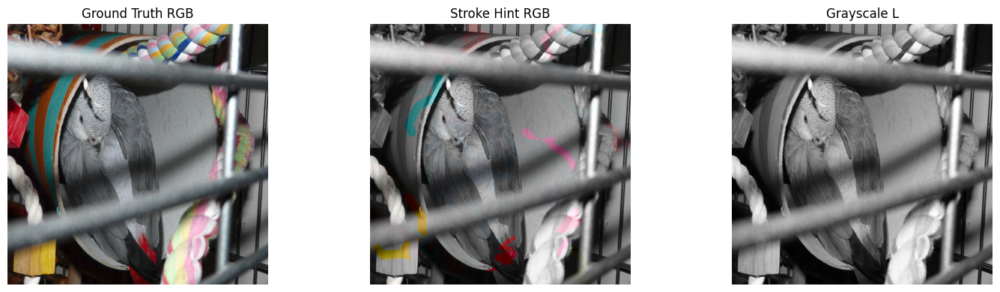

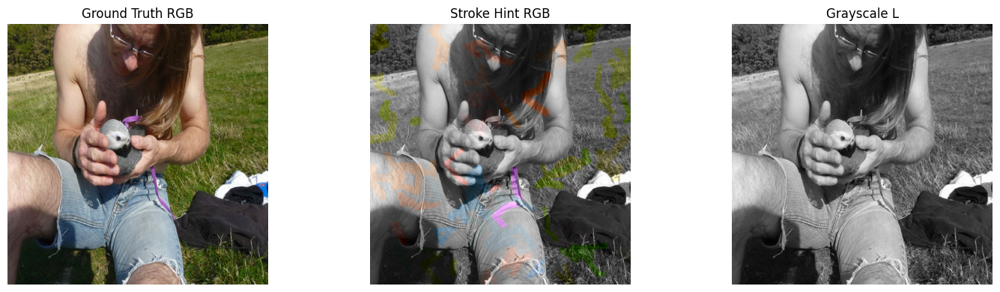

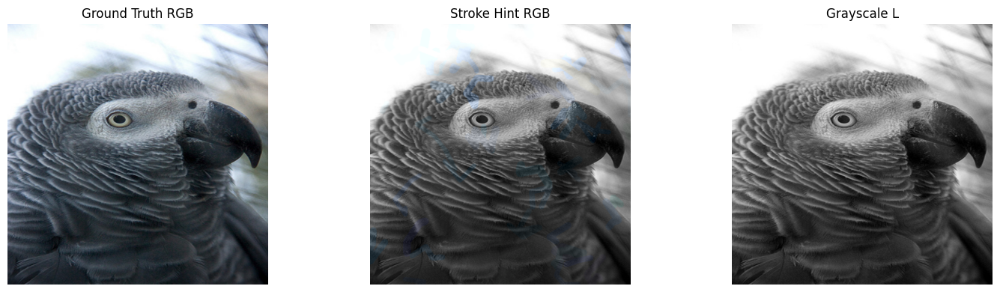

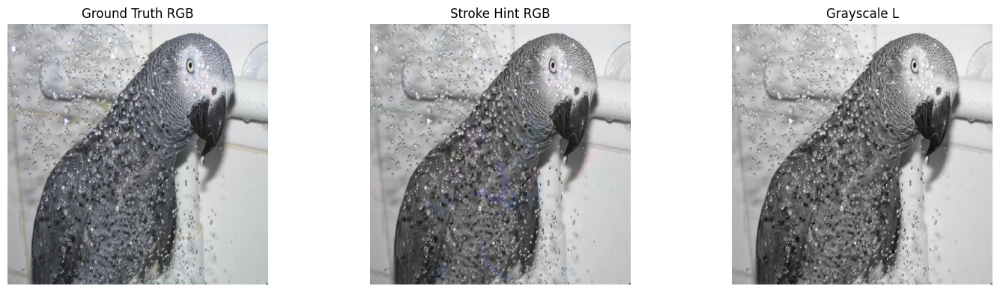

In [ ]:
import glob

image_paths = glob.glob("/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/train/n01817953/*.JPEG")[:10]  # Keep small for testing

dataset = MultiCueStrokeDataset(image_paths, img_size=512)
visualize_segment_hint_dataset(dataset, max_images=15)


### ============================================
### MultiCueStrokeDataset: Custom Stroke-Based Colorization Dataset
### ============================================
 This dataset is designed for training models on stroke-based image colorization.
 It simulates user-intent strokes on grayscale images based on object-aware regions.

#### Key Features:
 - Uses DeepLabV3 (ResNet50) pretrained model to generate semantic segmentation masks.
 - For each object segment, colored strokes are drawn directly on the image.
 - Color hints are extracted from the original image and converted to LAB space.
 - Input is a 4-channel tensor: [L (grayscale), a_hint, b_hint, mask].
 - Target is the ground truth ab chrominance channels from the original LAB image.

#### Returns:
 - input_tensor: 4-channel input for the model.
 - ab_gt_tensor: Ground truth ab channels for supervision.

 This dataset is compatible with models like U-Net or GANs for learning
 stroke-aware colorization, enabling training on 63K+ images with diverse structure and intent.


In [5]:
import numpy as np
import cv2
from torchvision import models
import torchvision.transforms as T
from torch.utils.data import Dataset
from PIL import Image
import torch
import random
from scipy.ndimage import center_of_mass


class MultiCueStrokeDataset(Dataset):
    def __init__(self, image_paths, img_size=256,
                 strokes_per_object=30, stroke_thickness=(8, 16), device='cpu'):
        self.image_paths = image_paths
        self.img_size = img_size
        self.strokes_per_object = strokes_per_object
        self.stroke_thickness = stroke_thickness
        self.device = device

        self.resize = T.Resize((img_size, img_size))
        self.to_tensor = T.ToTensor()
        self.to_gray = T.Grayscale(num_output_channels=1)

        self.seg_model = models.segmentation.deeplabv3_resnet50(pretrained=True).to(self.device).eval()
        self.seg_preprocess = T.Compose([
            T.Resize((img_size, img_size)),
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225]),
        ])

    def __len__(self):
        return len(self.image_paths)

    def draw_intent_strokes(self, mask, img_np, stroke_img, count):
        coords = np.argwhere(mask)
        H, W = mask.shape
        if len(coords) == 0:
            return stroke_img

        placed = 0
        attempts = 0
        while placed < count and attempts < count * 5:
            y0, x0 = coords[random.randint(0, len(coords) - 1)]
            color = img_np[y0, x0]

            if not mask[y0, x0]:
                attempts += 1
                continue

            num_points = random.randint(3, 6)
            pts = [(x0, y0)]
            for _ in range(num_points - 1):
                dx = random.randint(-40, 40)
                dy = random.randint(-40, 40)
                x1 = np.clip(pts[-1][0] + dx, 0, W - 1)
                y1 = np.clip(pts[-1][1] + dy, 0, H - 1)
                if not mask[int(y1), int(x1)]:
                    continue
                pts.append((int(x1), int(y1)))

            if len(pts) >= 2:
                thickness = random.randint(*self.stroke_thickness)
                for i in range(len(pts) - 1):
                    cv2.line(stroke_img, pts[i], pts[i + 1], color=tuple(map(int, color)), thickness=thickness)
                placed += 1

            attempts += 1

        return stroke_img

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        img = self.resize(img)
        img_np = np.array(img)

        with torch.no_grad():
            seg_tensor = self.seg_preprocess(img).unsqueeze(0).to(self.device)
            seg_map = self.seg_model(seg_tensor)['out'][0].argmax(0).cpu().numpy()

        stroke_img = np.zeros((self.img_size, self.img_size, 3), dtype=np.uint8)

        for seg_id in np.unique(seg_map):
            mask = seg_map == seg_id
            if np.sum(mask) < 20:
                continue

            stroke_img = self.draw_intent_strokes(mask, img_np, stroke_img, count=self.strokes_per_object)

        # Convert to LAB
        L_tensor = self.to_tensor(self.to_gray(img))
        lab_hint = cv2.cvtColor(stroke_img, cv2.COLOR_RGB2LAB)
        ab_hint = (lab_hint[:, :, 1:].astype(np.float32) - 128) / 128.0
        ab_hint_tensor = torch.from_numpy(ab_hint.transpose(2, 0, 1)).float()

        lab_gt = cv2.cvtColor(img_np, cv2.COLOR_RGB2LAB).astype(np.float32)
        ab_gt = (lab_gt[:, :, 1:] - 128) / 128.0
        ab_gt_tensor = torch.from_numpy(ab_gt.transpose(2, 0, 1)).float()

        input_tensor = torch.cat([L_tensor, ab_hint_tensor], dim=0)
        return input_tensor, ab_gt_tensor



In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import torch
from torch.utils.data import DataLoader

# Function to visualize the images in the dataset
def visualize_dataset(dataset, max_images=3, batch_size=1):
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False, num_workers=0)
    shown = 0

    for inputs, targets in loader:
        L_batch = inputs[:, 0].cpu().numpy()
        hint_ab_batch = inputs[:, 1:3].cpu().numpy()
        target_ab_batch = targets.cpu().numpy()

        for i in range(inputs.shape[0]):
            if shown >= max_images:
                return

            L = (L_batch[i] * 255).astype(np.uint8)
            hint_ab = (hint_ab_batch[i] * 128 + 128).astype(np.uint8).transpose(1, 2, 0)
            target_ab = (target_ab_batch[i] * 128 + 128).astype(np.uint8).transpose(1, 2, 0)

            lab_hint = np.zeros((L.shape[0], L.shape[1], 3), dtype=np.uint8)
            lab_hint[:, :, 0] = L
            lab_hint[:, :, 1:] = hint_ab

            lab_gt = np.zeros_like(lab_hint)
            lab_gt[:, :, 0] = L
            lab_gt[:, :, 1:] = target_ab

            rgb_hint = cv2.cvtColor(lab_hint, cv2.COLOR_LAB2RGB)
            rgb_gt = cv2.cvtColor(lab_gt, cv2.COLOR_LAB2RGB)

            plt.figure(figsize=(15, 4))
            plt.subplot(1, 3, 1)
            plt.imshow(rgb_gt)
            plt.title("Ground Truth RGB")
            plt.axis("off")

            plt.subplot(1, 3, 2)
            plt.imshow(rgb_hint)
            plt.title("Stroke Hint RGB")
            plt.axis("off")

            plt.subplot(1, 3, 3)
            plt.imshow(L, cmap="gray")
            plt.title("Grayscale L")
            plt.axis("off")

            plt.tight_layout()
            plt.show()

            shown += 1


In [1]:
import os
import cv2
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel

# CONFIG & SETUP
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
TEST_FOLDER = "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/test"
image_paths = sorted([os.path.join(TEST_FOLDER, f) for f in os.listdir(TEST_FOLDER) if f.endswith(".JPEG")])[:8]


2025-04-24 03:12:47.811448: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745464368.211542      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745464368.322680      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
# PIPELINE LOADING USING CONTROLNET AND STABLE DIFFUSION PRETRAINED MODELS
controlnet = ControlNetModel.from_pretrained(
    "lllyasviel/control_v11p_sd15_canny",
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
)

pipe = StableDiffusionControlNetPipeline.from_pretrained(
    "runwayml/stable-diffusion-v1-5",
    controlnet=controlnet,
    torch_dtype=torch.float16 if torch.cuda.is_available() else torch.float32,
).to(DEVICE)

pipe.vae.enable_tiling()
pipe.enable_attention_slicing()


config.json:   0%|          | 0.00/996 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 15 files:   0%|          | 0/15 [00:00<?, ?it/s]

scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.72k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

config.json:   0%|          | 0.00/617 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/472 [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.22G [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/492M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/806 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/743 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.44G [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [7]:
# ================
# CONFIG
# ================
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
IMG_SIZE = 512
TEST_FOLDER = "/kaggle/input/imagenet-object-localization-challenge/ILSVRC/Data/CLS-LOC/test"
image_paths = sorted([
    os.path.join(TEST_FOLDER, f)
    for f in os.listdir(TEST_FOLDER)
    if f.lower().endswith(".jpeg")
])[:8]  # Select a few test images


In [9]:
# LOADING DATASET
from torch.utils.data import DataLoader

dataset = MultiCueStrokeDataset(image_paths, img_size=IMG_SIZE, device=DEVICE)
loader = DataLoader(dataset, batch_size=1)

Running Inference:   0%|          | 0/8 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  12%|█▎        | 1/8 [00:08<01:00,  8.67s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  25%|██▌       | 2/8 [00:17<00:52,  8.72s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  38%|███▊      | 3/8 [00:26<00:44,  8.82s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  50%|█████     | 4/8 [00:35<00:35,  8.95s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
Running Inference:  62%|██████▎   | 5/8 [00:44<00:27,  9.01s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  75%|███████▌  | 6/8 [00:53<00:17,  8.96s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Running Inference:  88%|████████▊ | 7/8 [01:02<00:08,  8.90s/it]

  0%|          | 0/20 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.
Running Inference: 100%|██████████| 8/8 [01:11<00:00,  8.88s/it]


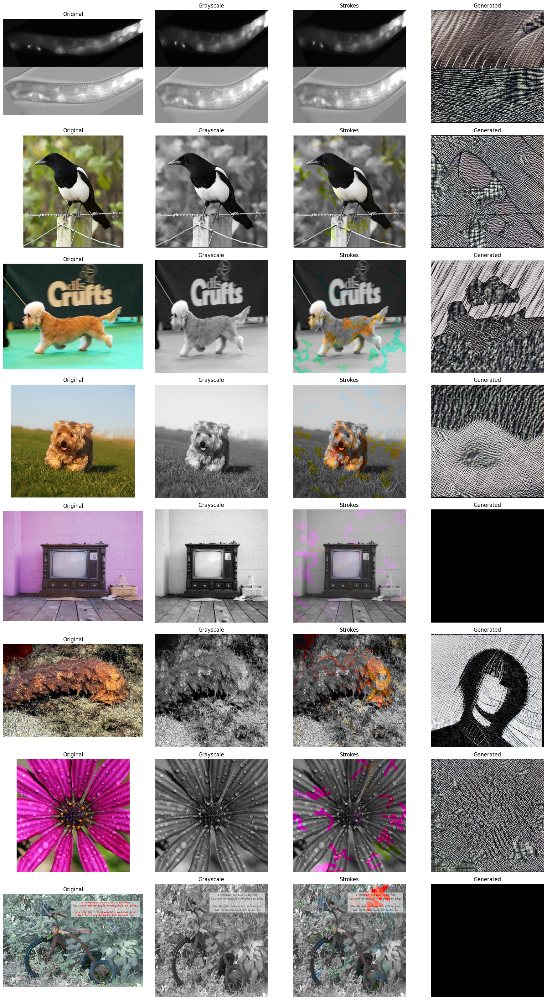

In [13]:
# INFERENCE & VISUALIZATION
fig, axs = plt.subplots(len(image_paths), 4, figsize=(18, len(image_paths) * 4))

for i, (input_tensor, _) in enumerate(tqdm(loader, desc="Running Inference")):
    input_tensor = input_tensor.to(DEVICE)

    # Separate inputs
    L = input_tensor[:, 0:1]
    ab_hint = input_tensor[:, 1:3]

    # Recreate grayscale and stroke image
    L_np = (L[0, 0].cpu().numpy() * 255).astype(np.uint8)
    gray = cv2.cvtColor(cv2.merge([L_np]*3), cv2.COLOR_RGB2GRAY)

    ab_np = ab_hint[0].cpu().numpy()
    ab_np = (ab_np * 128 + 128).clip(0, 255).astype(np.uint8)
    lab_hint = np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
    lab_hint[..., 0] = L_np
    lab_hint[..., 1:] = ab_np.transpose(1, 2, 0)
    stroke_img = cv2.cvtColor(lab_hint, cv2.COLOR_LAB2RGB)

    # Prepare control input
    control_tensor = input_tensor[0].cpu().numpy()
    control_tensor = control_tensor.astype(np.float32)
    control_tensor[0] = control_tensor[0]  # L is [0, 1]
    control_tensor[1:] = (control_tensor[1:] + 1) / 2.0  # ab is [-1, 1] → [0, 1]
    control_tensor = torch.from_numpy(control_tensor).unsqueeze(0).to(DEVICE, dtype=pipe.controlnet.dtype)

    # Inference
    prompt = "generate the color version of the image using the strokes"
    with torch.autocast("cuda" if DEVICE == "cuda" else "cpu"):
        result = pipe(prompt, image=control_tensor, num_inference_steps=20).images[0]

    # Load original image for reference
    original = cv2.cvtColor(cv2.imread(image_paths[i]), cv2.COLOR_BGR2RGB)

    # Display
    axs[i, 0].imshow(original)
    axs[i, 0].set_title("Original")

    axs[i, 1].imshow(gray, cmap="gray")
    axs[i, 1].set_title("Grayscale")

    axs[i, 2].imshow(stroke_img)
    axs[i, 2].set_title("Strokes")

    axs[i, 3].imshow(result)
    axs[i, 3].set_title("Generated")

    for j in range(4):
        axs[i, j].axis("off")

plt.tight_layout()
plt.show()
